<img src = "https://www.eesc.europa.eu/sites/default/files/styles/large/public/images/shutterstock_1642888921.jpg?itok=P9-6YhGd" width=50%>

#### Here, using a data set based on information about covid-19 vaccination, I designed and implemented a model to predict the number of injected shots.

## Importing the libraries

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import sklearn
import xgboost as xgb
import warnings
from sklearn.preprocessing import LabelEncoder
from IPython.display import Image
import scipy
import plotly.express as px
from itertools import product
import statsmodels.api as sm
import datetime
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
warnings.filterwarnings('ignore')

## Load and Prepare Data

In [2]:
mydata = pd.read_csv ('country_vaccinations.csv')

## EDA

In [3]:
mydata.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://reliefweb.int/sites/reliefweb.int/file...
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://reliefweb.int/sites/reliefweb.int/file...
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://reliefweb.int/sites/reliefweb.int/file...
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://reliefweb.int/sites/reliefweb.int/file...
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://reliefweb.int/sites/reliefweb.int/file...


In [4]:
mydata.tail()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
61815,Zimbabwe,ZWE,2021-11-30,6611942.0,3795401.0,2816541.0,25439.0,22460.0,43.81,25.15,18.66,1488.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...
61816,Zimbabwe,ZWE,2021-12-01,6640440.0,3809900.0,2830540.0,28498.0,21938.0,44.00,25.24,18.76,1454.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...
61817,Zimbabwe,ZWE,2021-12-02,6682111.0,3830488.0,2851623.0,41671.0,24152.0,44.28,25.38,18.89,1600.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...
61818,Zimbabwe,ZWE,2021-12-03,6710095.0,3845246.0,2864849.0,27984.0,23681.0,44.46,25.48,18.98,1569.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...
61819,Zimbabwe,ZWE,2021-12-04,6742193.0,3866139.0,2876054.0,32098.0,25964.0,44.67,25.62,19.06,1720.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...


In [5]:
mydata.sample(10)

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
3210,Austria,AUT,2021-02-02,285835.0,245594.0,40210.0,17776.0,8736.0,3.16,2.72,0.44,966.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://info.gesundheitsministerium.gv.at/data...
45400,Qatar,QAT,2021-10-30,4832023.0,NaN,NaN,1214.0,3533.0,164.89,NaN,NaN,1206.0,"Moderna, Pfizer/BioNTech",Ministry of Public Health,https://covid19.moph.gov.qa/EN/Pages/Vaccinati...
49388,Seychelles,SYC,2021-02-01,35079.0,35079.0,NaN,NaN,2170.0,35.47,35.47,NaN,21939.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V",World Health Organization,https://covid19.who.int/
47959,Sao Tome and Principe,STP,2021-07-13,NaN,NaN,NaN,NaN,531.0,NaN,NaN,NaN,2377.0,Oxford/AstraZeneca,World Health Organization,https://covid19.who.int/
9164,Cambodia,KHM,2021-07-02,7558008.0,4391526.0,3166482.0,149491.0,134533.0,44.60,25.91,18.69,7939.0,"Johnson&Johnson, Oxford/AstraZeneca, Sinopharm...",Ministry of Health,https://www.facebook.com/MinistryofHealthofCam...
34302,Maldives,MDV,2021-04-24,368150.0,291227.0,76923.0,7153.0,6945.0,67.72,53.57,14.15,12775.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",Presidency of the Maldives,https://twitter.com/HPA_MV/status/146663237078...
19685,French Polynesia,PYF,2021-05-29,NaN,NaN,NaN,NaN,1229.0,NaN,NaN,NaN,4350.0,"Johnson&Johnson, Pfizer/BioNTech",SPC Public Health Division,https://stats.pacificdata.org/vis?tm=covid&pg=...
39128,Netherlands,NLD,2021-06-10,11640368.0,NaN,NaN,244914.0,195439.0,67.78,NaN,NaN,11381.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Government of the Netherlands,https://coronadashboard.government.nl/landelij...
44549,Poland,POL,2021-05-14,15509013.0,11329356.0,4415044.0,364242.0,299936.0,41.03,29.97,11.68,7935.0,"Johnson&Johnson, Moderna, Oxford/AstraZeneca, ...",Ministry of Health,https://www.gov.pl/web/szczepimysie/raport-szc...
47903,Sao Tome and Principe,STP,2021-05-18,12374.0,12374.0,NaN,NaN,53.0,5.54,5.54,NaN,237.0,Oxford/AstraZeneca,World Health Organization,https://covid19.who.int/


In [6]:
mydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61820 entries, 0 to 61819
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              61820 non-null  object 
 1   iso_code                             61820 non-null  object 
 2   date                                 61820 non-null  object 
 3   total_vaccinations                   33283 non-null  float64
 4   people_vaccinated                    31679 non-null  float64
 5   people_fully_vaccinated              28875 non-null  float64
 6   daily_vaccinations_raw               27289 non-null  float64
 7   daily_vaccinations                   61481 non-null  float64
 8   total_vaccinations_per_hundred       33283 non-null  float64
 9   people_vaccinated_per_hundred        31679 non-null  float64
 10  people_fully_vaccinated_per_hundred  28875 non-null  float64
 11  daily_vaccinations_per_milli

In [7]:
mydata.shape

(61820, 15)

In [8]:
mydata.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million
count,3.328300e+04,3.167900e+04,2.887500e+04,2.728900e+04,6.148100e+04,33283.000000,31679.000000,28875.000000,61481.000000
mean,3.027482e+07,1.245660e+07,8.790462e+06,2.644717e+05,1.329423e+05,58.457630,33.382572,26.873450,3473.981572
std,1.593538e+08,4.903023e+07,3.328703e+07,1.242607e+06,8.165100e+05,53.626851,27.175492,25.258668,4160.734058
min,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,3.498580e+05,2.526295e+05,1.448050e+05,5.218000e+03,9.890000e+02,9.020000,6.880000,3.650000,647.000000
50%,2.309864e+06,1.471101e+06,1.039638e+06,2.535500e+04,7.371000e+03,43.160000,28.800000,18.790000,2251.000000
75%,1.089720e+07,6.017616e+06,5.039238e+06,1.224200e+05,4.254000e+04,101.845000,58.145000,48.265000,5055.000000
max,2.543424e+09,1.225000e+09,1.110506e+09,2.474100e+07,2.242429e+07,296.070000,121.680000,118.200000,117497.000000


In [9]:
mydata["date"]= pd.to_datetime(mydata.date)

In [10]:
mydata["Total_vaccinations(count)"]= mydata.groupby("country").total_vaccinations.tail(1)
mydata.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)

country
China             2.543424e+09
India             1.273806e+09
United States     4.685168e+08
Brazil            3.144508e+08
Indonesia         2.414419e+08
Japan             1.974232e+08
Mexico            1.332562e+08
Russia            1.302656e+08
Vietnam           1.268468e+08
Germany           1.266218e+08
Pakistan          1.247606e+08
Turkey            1.208575e+08
United Kingdom    1.173700e+08
France            1.070439e+08
Iran              1.047811e+08
Bangladesh        1.011984e+08
England           9.847104e+07
Italy             9.842585e+07
Thailand          9.375316e+07
Philippines       9.021417e+07
Name: Total_vaccinations(count), dtype: float64

In [11]:
#Top countries with fully  vaccinated peoples
mydata["Full_vaccinations(count)"]= mydata.groupby("country").people_fully_vaccinated.tail(1)

mydata.groupby("country")["Full_vaccinations(count)"].mean().sort_values(ascending= False).head(20)

country
India             474060721.0
United States     197074344.0
Brazil            136830588.0
Indonesia          99009581.0
Japan              97558098.0
Mexico             65166868.0
Russia             58480065.0
Germany            57323690.0
Vietnam            53691472.0
Pakistan           51163078.0
Turkey             50632985.0
France             47303279.0
Iran               46522058.0
United Kingdom     46491583.0
Italy              44146567.0
Thailand           41732668.0
South Korea        41192348.0
England            38990840.0
Spain              37655150.0
Bangladesh         37558671.0
Name: Full_vaccinations(count), dtype: float64

In [12]:

country_vaccine = mydata.groupby(["country", "iso_code", "vaccines"])['total_vaccinations', 
                                                                       'total_vaccinations_per_hundred',
                                                                      'daily_vaccinations',
                                                                      'daily_vaccinations_per_million',
                                                                      'people_vaccinated',
                                                                      'people_vaccinated_per_hundred',
                                                                       'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred'
                                                                      ].max().reset_index()
country_vaccine.columns = ["Country", "iso_code", "Vaccines", "Total vac", "Percent_Vac", "Daily vac", 
                           "Daily vac per million", "People vaced", "People vaced per hundred",
                           'People fully vaced', 'People fully vaced percent']

In [13]:
country_vaccine

,Country,iso_code,Vaccines,Total vac,Percent_Vac,Daily vac,Daily vac per million,People vaced,People vaced per hundred,People fully vaced,People fully vaced percent
0,Afghanistan,AFG,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",5228706.0,13.13,162172.0,4071.0,4397449.0,11.04,3566192.0,8.95
1,Albania,ALB,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...",2111797.0,73.51,17565.0,6114.0,1075332.0,37.43,965964.0,33.62
2,Algeria,DZA,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",12145830.0,27.22,256927.0,5759.0,6740064.0,15.11,5380385.0,12.06
3,Andorra,AND,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",104534.0,135.14,1762.0,22778.0,54999.0,71.10,49535.0,64.04
4,Angola,AGO,Oxford/AstraZeneca,9847459.0,29.02,183173.0,5398.0,6774984.0,19.97,3072475.0,9.05
...,...,...,...,...,...,...,...,...,...,...,...
218,Wales,OWID_WLS,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",5673108.0,178.96,61187.0,19302.0,2470233.0,77.93,2267834.0,71.54
219,Wallis and Futuna,WLF,Moderna,11939.0,107.62,343.0,30918.0,6016.0,54.23,5923.0,53.39
220,Yemen,YEM,"Johnson&Johnson, Oxford/AstraZeneca, Sinovac",774953.0,2.54,15349.0,503.0,548933.0,1.80,361351.0,1.19
221,Zambia,ZMB,"Johnson&Johnson, Oxford/AstraZeneca, Sinopharm...",1134766.0,6.00,13814.0,730.0,806611.0,4.26,731770.0,3.87


In [14]:
vaccines = country_vaccine.Vaccines.unique()
for v in vaccines:
    countries = country_vaccine.loc[country_vaccine.Vaccines==v, 'Country'].values
    print(f"Vaccines: {v}: \nCountries: {list(countries)}\n")

Vaccines: Johnson&Johnson, Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing: 
Countries: ['Afghanistan', 'Belize', 'Cameroon', 'Namibia']

Vaccines: Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V: 
Countries: ['Albania', 'Azerbaijan', 'Bosnia and Herzegovina', 'Oman']

Vaccines: Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac, Sputnik V: 
Countries: ['Algeria', 'Zimbabwe']

Vaccines: Moderna, Oxford/AstraZeneca, Pfizer/BioNTech: 
Countries: ['Andorra', 'Australia', 'Canada', 'England', 'Finland', 'Guernsey', 'Isle of Man', 'Japan', 'Jersey', 'Northern Ireland', 'Scotland', 'Sint Maarten (Dutch part)', 'Sweden', 'United Kingdom', 'Wales']

Vaccines: Oxford/AstraZeneca: 
Countries: ['Angola', 'Democratic Republic of Congo', 'Ethiopia', 'Falkland Islands', 'Fiji', 'Kiribati', 'Liberia', 'Mali', 'Montserrat', 'Nauru', 'Nigeria', 'Niue', 'Papua New Guinea', 'Pitcairn', 'Saint Helena', 'Saint Vincent and the Grenadines', 'Samoa', 'Sao Tome and Principe', 'Solomon Islands', 'Tog

In [15]:
vaccine = mydata.groupby(["vaccines"])['total_vaccinations','total_vaccinations_per_hundred',
                                       'daily_vaccinations','daily_vaccinations_per_million'].max().reset_index()
vaccine.columns = ["Vaccines", "Total vaccinations", "Percent", "Daily vaccinations", 
                           "Daily vaccinations per million"]

In [16]:
vaccine

,Vaccines,Total vaccinations,Percent,Daily vaccinations,Daily vaccinations per million
0,"Abdala, Johnson&Johnson, Oxford/AstraZeneca, P...",6376188.0,95.13,311302.0,46446.0
1,"Abdala, Sinopharm/Beijing, Sinovac, Sputnik V",26314390.0,91.67,466473.0,16251.0
2,"Abdala, Soberana02",28592611.0,252.64,321878.0,28441.0
3,"COVIran Barekat, Covaxin, Oxford/AstraZeneca, ...",104781077.0,123.23,1225502.0,14413.0
4,"CanSino, Covaxin, Moderna, Oxford/AstraZeneca,...",124760553.0,55.40,1280906.0,5688.0
...,...,...,...,...,...
71,"Pfizer/BioNTech, Sputnik V",47834.0,140.65,725.0,21317.0
72,"QazVac, Sinopharm/Beijing, Sputnik V",16937209.0,89.17,142997.0,7528.0
73,Sinopharm/Beijing,446624.0,30.80,5013.0,3458.0
74,"Sinopharm/Beijing, Sputnik V",6331049.0,67.05,50823.0,5382.0


In [37]:
display(mydata[['country','vaccines','total_vaccinations','total_vaccinations_per_hundred','people_vaccinated_per_hundred',
                'people_fully_vaccinated_per_hundred','daily_vaccinations_per_million',]].groupby(['country','vaccines']).agg
        (["max",'mean',"min"]).style.background_gradient(cmap="CMRmap_r"))

## Data Preprocessing

In [17]:
mydata.isnull().sum()

country                                    0
iso_code                                   0
date                                       0
total_vaccinations                     28537
people_vaccinated                      30141
people_fully_vaccinated                32945
daily_vaccinations_raw                 34531
daily_vaccinations                       339
total_vaccinations_per_hundred         28537
people_vaccinated_per_hundred          30141
people_fully_vaccinated_per_hundred    32945
daily_vaccinations_per_million           339
vaccines                                   0
source_name                                0
source_website                             0
Total_vaccinations(count)              61600
Full_vaccinations(count)               61605
dtype: int64

In [18]:
mydata.fillna(0,inplace=True)

In [19]:
mydata.isnull().sum()

country                                0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
daily_vaccinations_raw                 0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
daily_vaccinations_per_million         0
vaccines                               0
source_name                            0
source_website                         0
Total_vaccinations(count)              0
Full_vaccinations(count)               0
dtype: int64

## Strorytelling - Visualization

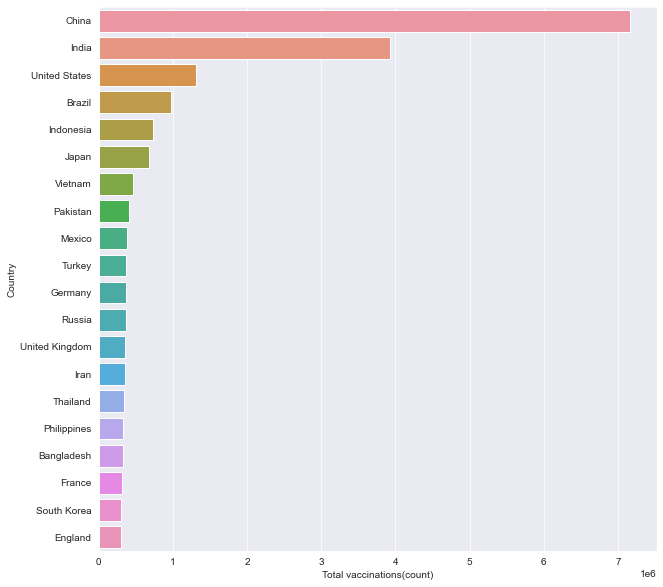

In [20]:
#barplot visualization of top countries with most vaccinations
x= mydata.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)
sns.set_style("darkgrid")
plt.figure(figsize= (10,10))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Total vaccinations(count)")
ax.set_ylabel("Country")
plt.show()

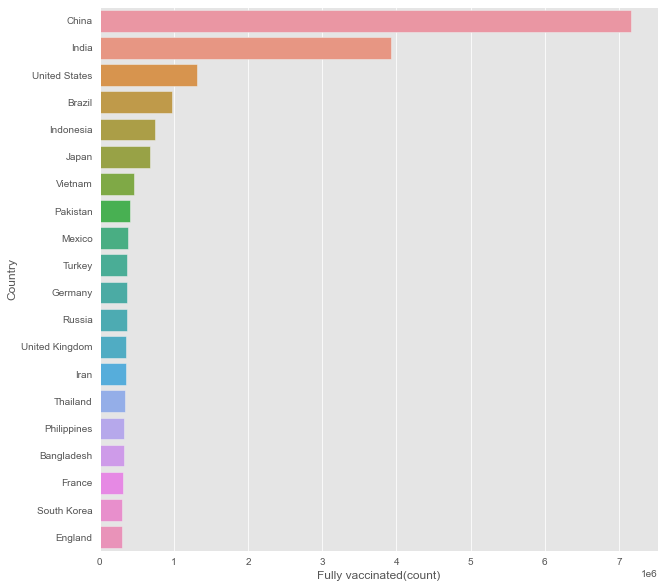

In [21]:
#barplot visualization of top countries with most full vaccinations

plt.style.use("ggplot")
plt.figure(figsize= (10,10))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Fully vaccinated(count)")
ax.set_ylabel("Country")
plt.show()

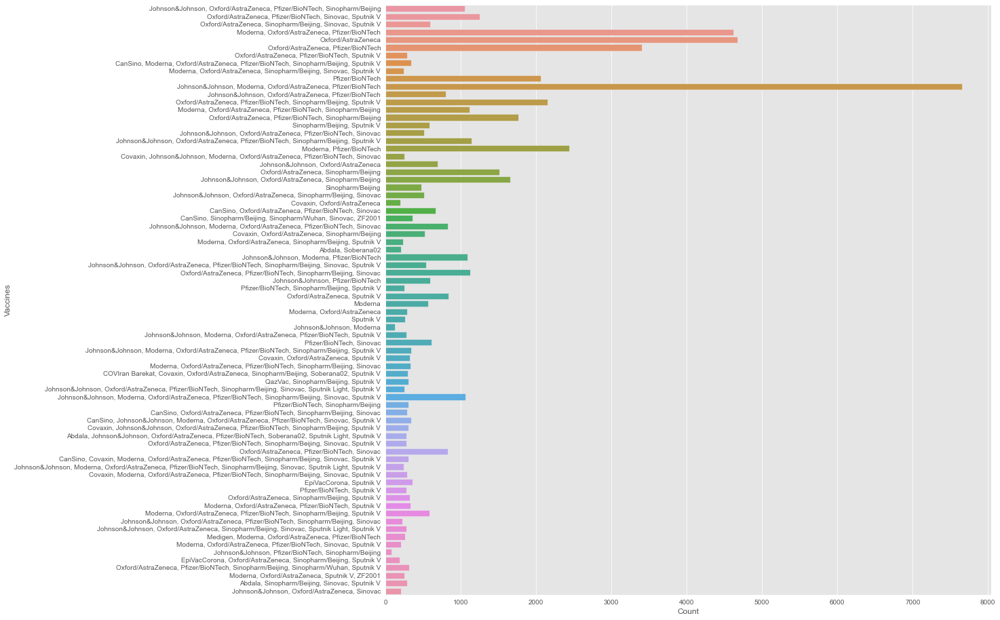

In [22]:
plt.figure(figsize=(16,16))
sns.countplot(y= "vaccines",data= mydata)
plt.ylabel("Vaccines")
plt.xlabel("Count")
plt.show()

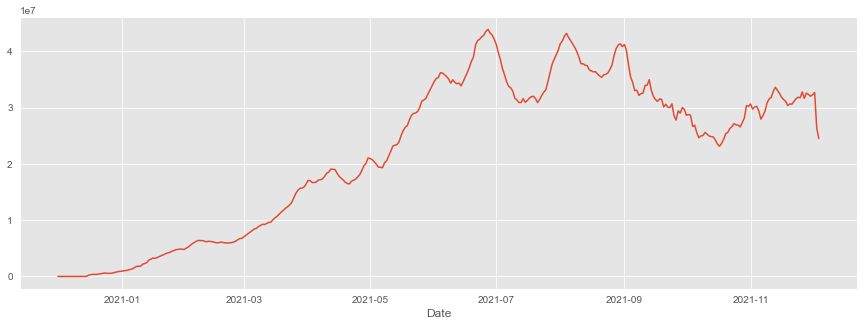

In [23]:
#daily vaccinations
x= mydata.groupby("date").daily_vaccinations.sum()
plt.style.use("ggplot")
plt.figure(figsize= (15,5))
sns.lineplot(x.index,x.values)
plt.xlabel("Date")
plt.show()

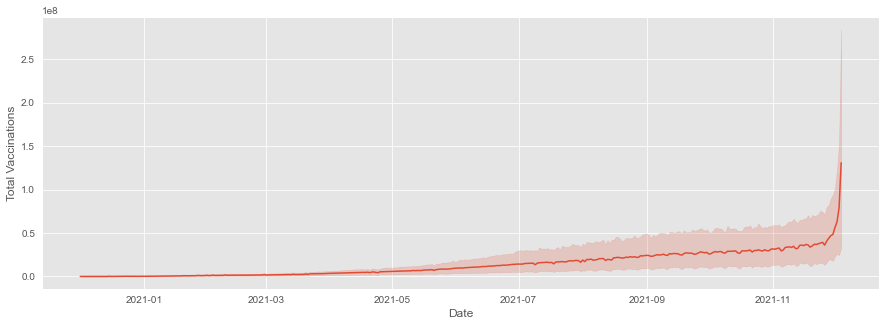

In [24]:
#total vaccinations
plt.figure(figsize= (15,5))
sns.lineplot(x= "date",y= "total_vaccinations",data= mydata)
plt.xlabel("Date")
plt.ylabel("Total Vaccinations")
plt.show()

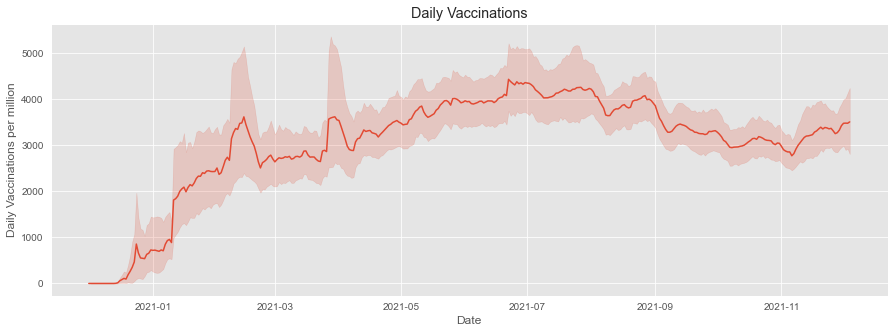

In [25]:
#daily vaccination per million 
plt.figure(figsize= (15,5))
plt.style.use("ggplot")
sns.lineplot(x= "date",y= "daily_vaccinations_per_million",data= mydata)
plt.title("Daily Vaccinations")
plt.ylabel("Daily Vaccinations per million")
plt.xlabel("Date")
plt.show()

In [26]:
#vaccination per hundred top countries
mydata["Total_vaccinations_per_hundred"]= mydata.groupby("country").total_vaccinations_per_hundred.tail(1)

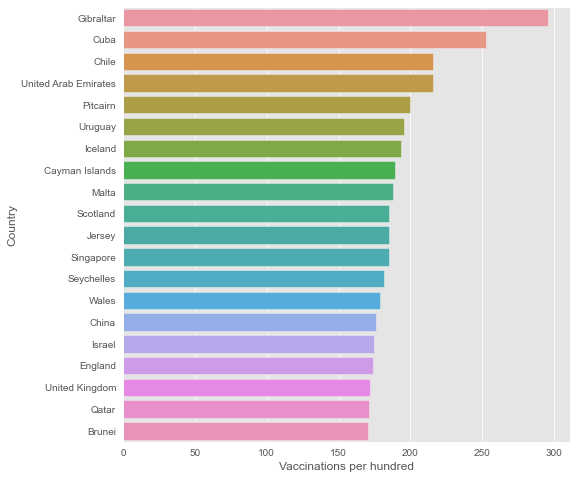

In [27]:
x= mydata.groupby("country")["Total_vaccinations_per_hundred"].mean().sort_values(ascending= False).head(20)
plt.figure(figsize= (8,8))
ax= sns.barplot(x.values,x.index)
ax.set_ylabel("Country")
ax.set_xlabel("Vaccinations per hundred")
plt.show()

In [28]:
#Amount of vaccinated citizens
cols = ['country', 'total_vaccinations', 'iso_code', 'vaccines', 'total_vaccinations_per_hundred']
vacc_amount = mydata[cols].groupby('country').max().sort_values('total_vaccinations', ascending=False)

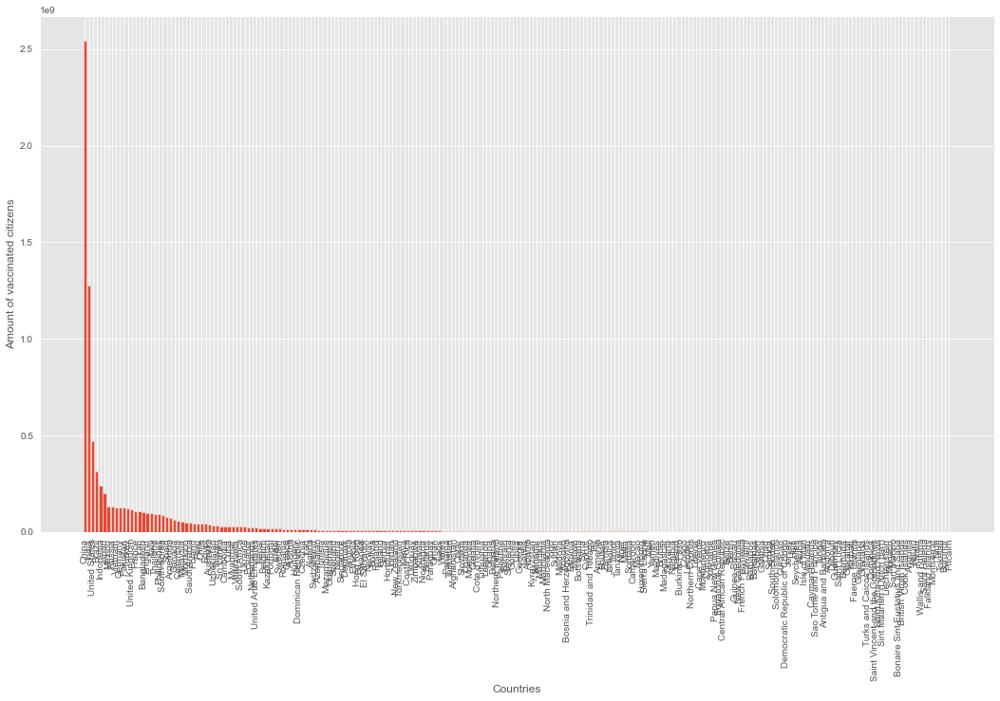

In [29]:
plt.figure(figsize=(18, 10))
plt.bar(vacc_amount.index, vacc_amount.total_vaccinations)
plt.xticks(rotation = 90)
plt.ylabel('Amount of vaccinated citizens')
plt.xlabel('Countries')
plt.show()

In [30]:
fig = px.choropleth(locations=vacc_amount.iso_code, color=vacc_amount.total_vaccinations, title='Amount of vaccinated citizens', 
                   color_continuous_scale='rainbow')
fig.show('notebook')

In [31]:
vacc_amount = vacc_amount.sort_values('total_vaccinations_per_hundred', ascending=False)

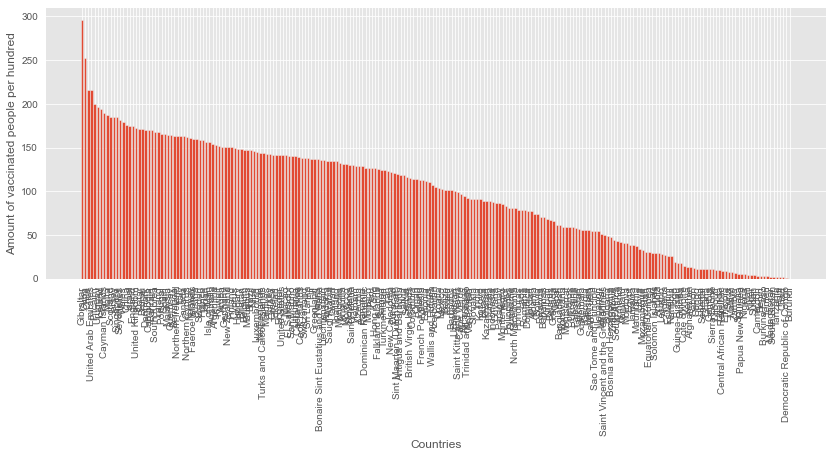

In [32]:
plt.figure(figsize=(14, 5))
plt.bar(vacc_amount.index, vacc_amount.total_vaccinations_per_hundred)
plt.xticks(rotation = 90)
plt.ylabel('Amount of vaccinated people per hundred')
plt.xlabel('Countries')
plt.show()

In [33]:
fig = px.choropleth(locations=vacc_amount.iso_code, color=vacc_amount.total_vaccinations_per_hundred, title='Amount of vaccinated citizens per hundred', 
                   color_continuous_scale='rainbow')
fig.show('notebook')

In [34]:
vacc_pop = vacc_amount.groupby('vaccines').sum().sort_values('total_vaccinations', ascending=False)

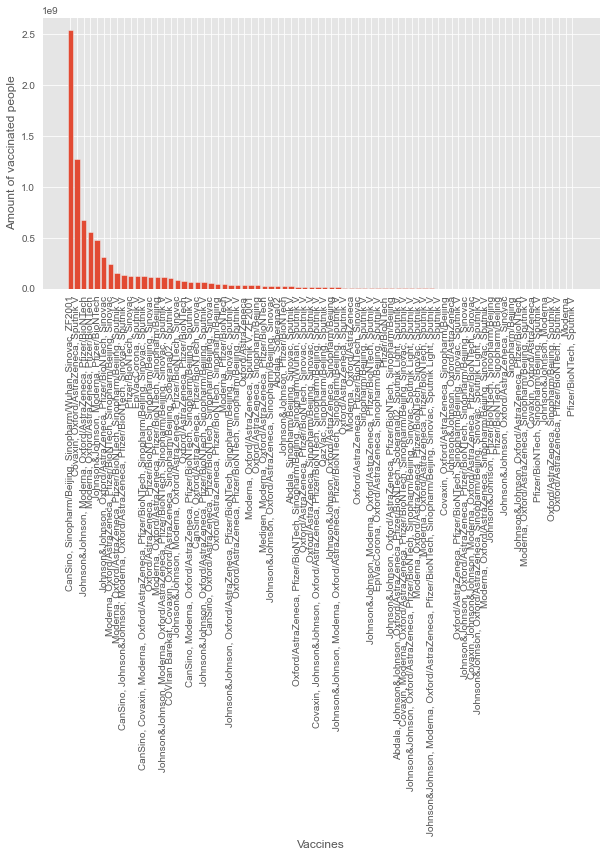

In [35]:
plt.figure(figsize=(10, 5))
plt.bar(vacc_pop.index, vacc_pop.total_vaccinations)
plt.xticks(rotation = 90)
plt.ylabel('Amount of vaccinated people')
plt.xlabel('Vaccines')
plt.show()

In [36]:
fig = px.choropleth(locations=vacc_amount.iso_code, color=vacc_amount.vaccines, title='Name of the vaccine', 
                   color_continuous_scale='rainbow')
fig.show()

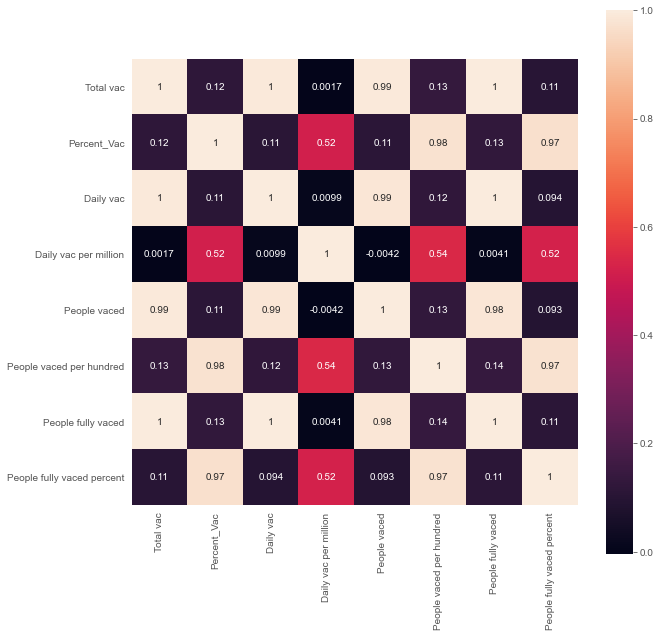

In [38]:
plt.subplots(figsize=(10, 10))
sns.heatmap(country_vaccine.corr(), annot=True, square=True)
plt.show()

## Prepare Data for Machine learning

In [39]:
country_vaccine.columns

Index(['Country', 'iso_code', 'Vaccines', 'Total vac', 'Percent_Vac',
       'Daily vac', 'Daily vac per million', 'People vaced',
       'People vaced per hundred', 'People fully vaced',
       'People fully vaced percent'],
      dtype='object')

In [40]:
X = country_vaccine[['Percent_Vac','People vaced per hundred','People fully vaced percent']]

In [41]:
y = country_vaccine['Total vac']

In [42]:
X

,Percent_Vac,People vaced per hundred,People fully vaced percent
0,13.13,11.04,8.95
1,73.51,37.43,33.62
2,27.22,15.11,12.06
3,135.14,71.10,64.04
4,29.02,19.97,9.05
...,...,...,...
218,178.96,77.93,71.54
219,107.62,54.23,53.39
220,2.54,1.80,1.19
221,6.00,4.26,3.87


In [43]:
y

0       5228706.0
1       2111797.0
2      12145830.0
3        104534.0
4       9847459.0
          ...    
218     5673108.0
219       11939.0
220      774953.0
221     1134766.0
222     6742193.0
Name: Total vac, Length: 223, dtype: float64

In [44]:
print(X.shape)
print(y.shape)

(223, 3)
(223,)


## Train your model

In [45]:
X_train,X_test,y_train,y_test = train_test_split (X,y,test_size=.20 ,random_state= 0)

In [46]:
dtr = DecisionTreeRegressor()
dtr.fit (X_train,y_train)

DecisionTreeRegressor()

In [47]:
y_prediction = dtr.predict(X_train)

## Test the model and show the metrics

In [48]:
print ('mean absolute error is:' , metrics.mean_absolute_error (y_train , y_prediction))
print ('mean squared error is:' , metrics.mean_squared_error (y_train, y_prediction))
print ('root mean squared error is:' , np.sqrt(metrics.mean_squared_error(y_train , y_prediction)))
print('r-squared is :', metrics.r2_score (y_train, y_prediction))

mean absolute error is: 0.0
mean squared error is: 0.0
root mean squared error is: 0.0
r-squared is : 1.0


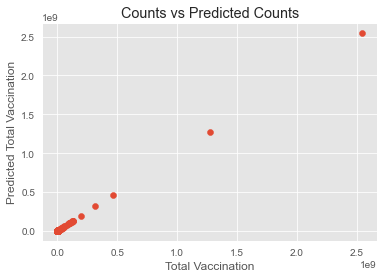

In [49]:
plt.scatter(y_train, y_prediction)
plt.xlabel("Total Vaccination")
plt.ylabel("Predicted Total Vaccination")
plt.title("Counts vs Predicted Counts")
plt.show()

In [50]:
regressor = DecisionTreeRegressor(random_state = 0)
regressor.fit(X_train, y_train)

DecisionTreeRegressor(random_state=0)

In [51]:
y_pred=regressor.predict([[178.96,77.93,71.54]])
y_pred

array([5673108.])